In [13]:
import importlib
import micasense.capture
import cv2
import os, glob
import json
import pickle #This library will maintain the format as well
from osgeo import gdal,osr
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import PIL.Image as Image
import datetime
from math import ceil
from tqdm import tqdm
import re
import glob
from PIL import Image
import contextlib

import algorithms.flight_attributes
import algorithms.validate_algorithm
import algorithms.select_GPS as SelectGPS
import algorithms.georeferencing

importlib.reload(algorithms.flight_attributes)
importlib.reload(algorithms.georeferencing)

import algorithms.flight_attributes as FlightAttributes
import algorithms.georeferencing as georeferencing

## Import data that has been processed by the Micasense's image processing library

In [5]:
imagePath = r"D:\EPMC_flight\pandanRes\00angle_15H_50overlap"
rawImagePath = os.path.join(imagePath,'RawImg') # We created a new folder called RawImg to store all the raw images here
flightAttributesPath = os.path.join(imagePath,'flight_attributes','flight_attributes.csv')
if os.path.exists(flightAttributesPath):
    log = pd.read_csv(flightAttributesPath)
log.head()

,timestamp,latitude,longitude,altitude,image_name,capture_id,dls-yaw,dls-pitch,dls-roll,irr-475,irr-560,irr-668,irr-842,irr-717,irr-444,irr-531,irr-650,irr-705,irr-740
0,2023-09-20 02:37:46.734108+00:00,1.318984,103.736576,30.643,IMG_0000_1.tif,iRMg5hgGW1CUYi1x0TlZ,0.635662,-0.207969,-0.047398,0.744841,0.663156,0.547643,0.342493,0.428046,0.670643,0.687768,0.544391,0.483355,0.445280
1,2023-09-20 02:38:25.652070+00:00,1.318969,103.736552,31.828,IMG_0001_1.tif,ws9iE0ctR0GdjP9XYeKY,1.768777,-0.081365,-0.034487,1.422521,1.305924,1.134642,0.701718,0.873402,1.247496,1.338475,1.114349,0.995491,0.917994
2,2023-09-20 02:40:02.646889+00:00,1.318935,103.736667,31.825,IMG_0002_1.tif,o34Xx90IfaznKeSuG8Bq,1.807706,-0.066323,-0.019898,0.403826,0.350253,0.274099,0.171907,0.214341,0.371606,0.366940,0.274736,0.241525,0.222003
3,2023-09-20 02:40:27.129650+00:00,1.318957,103.736711,43.093,IMG_0003_1.tif,9uaW8y0N0EE0vgF9zbKj,0.603067,-0.147849,0.018589,0.394172,0.341704,0.268347,0.168132,0.209751,0.362208,0.357995,0.268675,0.236576,0.217652
4,2023-09-20 02:40:28.687747+00:00,1.318989,103.736740,43.126,IMG_0004_1.tif,573tCs56BPBA8nQJo06y,0.632837,-0.131004,0.014908,0.393962,0.341402,0.268274,0.168016,0.209701,0.361889,0.357701,0.268546,0.236570,0.217697


## View flight altitude

In [6]:
# helper function that is only relevant to my file naming. I named my imagePath folder as the UAV height e.g. ...15H...
# this step is (optional)
height_dict = FlightAttributes.get_heights(imagePath,log)
height_dict

offset height: 26m


{'measuredHeight': 41.295,
 'actualHeight': 15,
 'height_max': 52.609,
 'height_min': 23.956,
 'DEM_offset_height': 26}

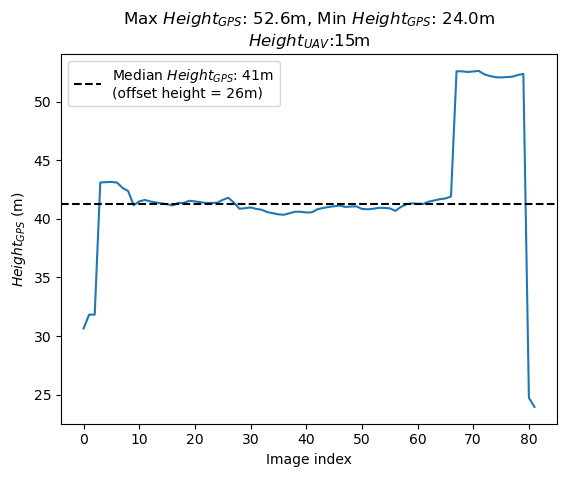

In [7]:
plt.figure()
plt.plot(log.index.to_list(),log['altitude'])
height_max = height_dict['height_max']
height_min = height_dict['height_min']
measuredHeight = height_dict['measuredHeight']
actualHeight = height_dict['actualHeight']
DEM_offset_height = height_dict['DEM_offset_height']
plt.axhline(y=measuredHeight, ls='--',c='k',label=r'Median $Height_{GPS}$:' f" {int(measuredHeight)}m\n(offset height = {DEM_offset_height}m)")
plt.title(r'Max $Height_{GPS}$:' + f' {height_max:.1f}m, ' + r'Min $Height_{GPS}$: ' + f'{height_min:.1f}m\n' + r'$Height_{UAV}$:' +f'{actualHeight}m')
plt.ylabel(r'$Height_{GPS}$ (m)')
plt.xlabel('Image index')
plt.legend()
# save fig
parentDir = os.path.join(os.path.dirname(imagePath),"images")
os.mkdir(parentDir) if not os.path.exists(parentDir) else None
fname = os.path.join(parentDir,f'height_timeseries.png')
plt.savefig(fname)

plt.show()

## Detect points/Import GPS points

[10, 15, 19, 25, 29, 35, 39, 45, 49, 55, 59, 65]


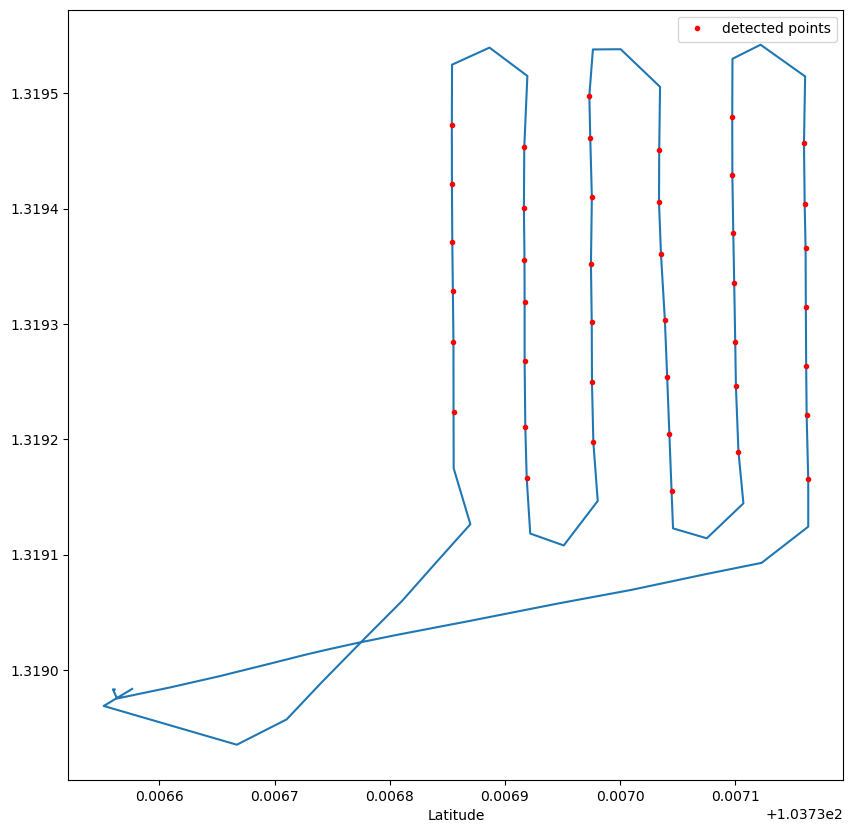

[10, 11, 12, 13, 14, 15, 19, 20, 21, 22, 23, 24, 25, 29, 30, 31, 32, 33, 34, 35, 39, 40, 41, 42, 43, 44, 45, 49, 50, 51, 52, 53, 54, 55, 59, 60, 61, 62, 63, 64, 65]


In [8]:
# import GPS points
ls_idx = SelectGPS.readSelectedGPS(rawImagePath)
# print(ls_idx)
# plot selected GPS points
DL = SelectGPS.DetectLines(log, n = 3, thresh=0.99, plot=True)
flight_points = DL.get_points(flight_points = ls_idx)
print(flight_points)

# No correction

shape of canvas(4580, 4566, 3)


,timestamp,latitude,longitude,altitude,image_name,capture_id,dls-yaw,dls-pitch,dls-roll,irr-475,irr-560,irr-668,irr-842,irr-717,irr-444,irr-531,irr-650,irr-705,irr-740,flight_angle
10,2023-09-20 02:40:46.867245+00:00,1.319223,103.736855,17.528,IMG_0010_1.tif,TGMjtoMK4lZZHwz0gWE2,0.098322,-0.067554,-0.011150,0.389261,0.336241,0.263961,0.165486,0.207043,0.357777,0.352711,0.264435,0.233321,0.214836,0.0
11,2023-09-20 02:40:48.333197+00:00,1.319285,103.736855,17.650,IMG_0011_1.tif,Vbmk53xTHky4YeQ3tY5q,0.105641,-0.061187,-0.012180,0.388711,0.335740,0.263521,0.165222,0.206712,0.357304,0.352196,0.264010,0.232936,0.214483,0.0
12,2023-09-20 02:40:49.529728+00:00,1.319329,103.736855,17.519,IMG_0012_1.tif,sHfimxse9xw3yckAG5jT,0.108555,-0.092849,-0.016617,0.388261,0.335334,0.263198,0.165027,0.206479,0.356898,0.351778,0.263695,0.232662,0.214233,0.0
13,2023-09-20 02:40:50.856883+00:00,1.319371,103.736854,17.435,IMG_0013_1.tif,JTvwKvY3Wp1QRFABs177,0.120106,-0.088623,-0.023227,0.387690,0.334802,0.262754,0.164750,0.206159,0.356389,0.351234,0.263266,0.232289,0.213892,0.0
14,2023-09-20 02:40:52.169954+00:00,1.319422,103.736854,17.352,IMG_0014_1.tif,GSCS3gkaTUELPKSWJdea,0.124905,-0.094922,-0.029860,0.387213,0.334354,0.262390,0.164522,0.205883,0.355956,0.350776,0.262902,0.231979,0.213612,0.0


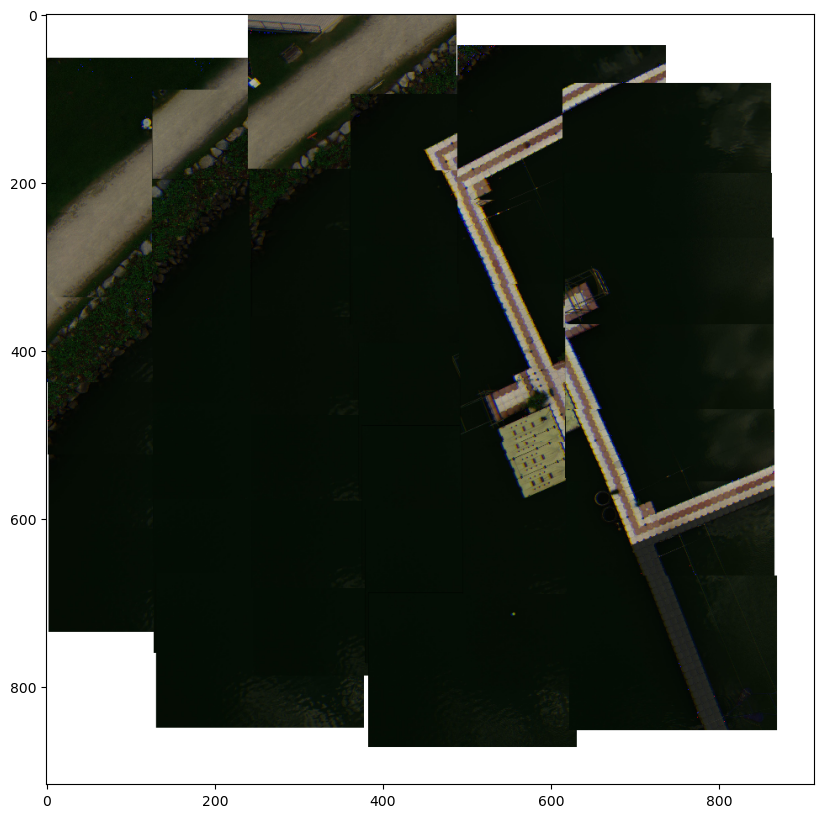

In [20]:
DEM_offset_height = height_min
df_cropped = log.iloc[flight_points,:]
df_cropped.loc[:,['flight_angle']] = -df_cropped['dls-yaw']/np.pi*180
#-----------adjust UAV's altitude instead of using GPS's altitude reading--------
df_cropped.loc[:,['altitude']] = df_cropped.loc[:,['altitude']] - DEM_offset_height
# ---- instead of using yaw, use the heading of the UAV----------
reclassify_angles = lambda x: -180 if x < -160 else 0
reclassified_angles = [reclassify_angles(i) for i in df_cropped['flight_angle'].to_list()]
df_cropped.loc[:,['flight_angle']] = reclassified_angles
#----------------------------------------------------------------
PG = FlightAttributes.PlotGeoreference(imagePath,df_cropped)
im_display = PG.plot_georeference(reduction_factor=5,plot=True)
df_cropped.head()

## Direct georeferencing with no correction

In [ ]:
for image_index, rows in df_cropped.iterrows():
    lat = rows['latitude']
    lon = rows['longitude']
    alt = rows['altitude']
    pitch = rows['dls-pitch']
    roll = rows['dls-roll']
    yaw = rows['dls-yaw']
    image_name = rows['image_name']
    print(f'[{image_index}] {image_name}')
    flight_angle = rows['flight_angle']
    georeferencing.directGeoreferencing_gdal(imagePath,image_name,lat,lon,alt,flight_angle,
                                             dirname=f"noCorrection_alt{int(measuredHeight - DEM_offset_height)}")

# Coordinate shift

In [ ]:
interpolate_distance = 0.01
pad_distance = 1.5
estimate_angle="yaw"
dist1 = 0
dist2 = 70
DEM_offset_height = 23#height_min

IC = FlightAttributes.InterpolateCoordinates(log, 
                            interpolate_distance=interpolate_distance, 
                            pad_distance=pad_distance,
                            estimate_angle=estimate_angle)
interp_dist_dict = IC.get_interpolated_dict()

n_fig = 8
fig, axes = plt.subplots(2,ceil(n_fig/2), figsize=(15,7))

dist_shift = int(pad_distance/interpolate_distance) - 1 # minus one so that we dont get indexing error

# for i, (shift_n,ax) in enumerate(zip(np.linspace(-dist_shift,dist_shift,n_fig,dtype=int),axes.flatten())):
for i, (shift_n,ax) in enumerate(zip(np.linspace(dist1,dist2,n_fig,dtype=int),axes.flatten())):
    df_interpolated = IC.shift_coord(interp_dist_dict, shift_n=shift_n)
    df_cropped = df_interpolated.iloc[flight_points,:]
    # ---- instead of using yaw, use the heading of the UAV----------
    reclassify_angles = lambda x: -180 if x < -160 else 0
    reclassified_angles = [reclassify_angles(i) for i in df_cropped['flight_angle'].to_list()]
    df_cropped['flight_angle'] = reclassified_angles
    #----------------------------------------------------------------
    for image_index, rows in df_cropped.iterrows():
        lat = rows['latitude']
        lon = rows['longitude']
        alt = rows['altitude'] - DEM_offset_height
        pitch = rows['dls-pitch']
        roll = rows['dls-roll']
        yaw = rows['dls-yaw']
        image_name = rows['image_name']
        print(f'[{image_index}] {image_name}')
        flight_angle = rows['flight_angle']
        georeferencing.directGeoreferencing_gdal(imagePath,image_name,lat,lon,alt,flight_angle,
                                                dirname=f"coordShift{shift_n}_alt{int(measuredHeight - DEM_offset_height)}")
    PG = FlightAttributes.PlotGeoreference(df_cropped,fp_list,DEM_offset_height = DEM_offset_height)
    im_display = PG.plot_georeference(reduction_factor=5,plot=False)
    ax.imshow(im_display)
    ax.axis('off')
    ax.set_title(f'Coord shift: {shift_n}')
# plt.suptitle(f'estimate angle: {estimate_angle}')
plt.show()

# Import all folder

In [2]:
rootDir = r"D:\EPMC_flight\pandanRes"
dirsList = [os.path.join(rootDir,f) for f in sorted(os.listdir(rootDir)) if f.endswith("overlap")]
rawImgDirs = [os.path.join(dirs,f) for dirs in dirsList for f in os.listdir(dirs) if f == "RawImg"]

# list all panel imges corresponding to the folder
panelImges = [0,0,0,0,0,55,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0]

assert len(panelImges) == len(rawImgDirs), "every directory must have one QR image"
folderPanelDir = []
for folderName, imgIdx in zip(rawImgDirs,panelImges):
    # folderPanelDir[folderName] = imgIdx
    folderPanelDir.append({'folderName': folderName, 'panelIndex': imgIdx})

folderPanelDir[0]

{'folderName': 'D:\\EPMC_flight\\pandanRes\\00angle_15H_50overlap\\RawImg',
 'panelIndex': 0}

In [3]:
selectedIdx = 0

# Import saved band_aligned images

In [60]:
imagePath =  folderPanelDir[selectedIdx]['folderName']
print(imagePath)
if os.path.exists(os.path.join(os.path.dirname(imagePath),'thumbnails')):
    parent_dir = os.path.join(os.path.dirname(imagePath),'thumbnails')
    fp_list = [os.path.join(parent_dir,fp) for fp in sorted(os.listdir(parent_dir))]

else:
    fp_list = None

fp_list

IndexError: list index out of range

# Import flight attributes data

In [ ]:
if os.path.exists(os.path.join(os.path.dirname(imagePath),'flight_attributes')):
    parent_dir = os.path.join(os.path.dirname(imagePath),'flight_attributes')
    flight_attributes_df = os.path.join(parent_dir,'flight_attributes.csv')
    flight_attributes_df = pd.read_csv(flight_attributes_df)
else:
    flight_attributes_df = None

flight_attributes_df

,timestamp,latitude,longitude,altitude,image_name,capture_id,dls-yaw,dls-pitch,dls-roll,irr-475,irr-560,irr-668,irr-842,irr-717,irr-444,irr-531,irr-650,irr-705,irr-740
0,2023-09-27 03:12:12.453792+00:00,1.319086,103.736614,25.920,IMG_0000_1.tif,tcM14s2sbaqDU36CYjr9,0.401776,-0.064070,-0.016254,1.462232,1.330085,1.146671,0.708960,0.888283,1.281602,1.367542,1.127977,1.010621,0.934026
1,2023-09-27 03:13:15.133932+00:00,1.319066,103.736697,40.538,IMG_0001_1.tif,V8Os44yAGMxgwTGexCkN,1.712272,-0.144050,0.081731,1.481220,1.363857,1.180974,0.723287,0.896873,1.291710,1.395275,1.155155,1.029100,0.950396
2,2023-09-27 03:13:26.146734+00:00,1.319125,103.736707,54.242,IMG_0002_1.tif,k9SxYSN8iNwEUvu0LGTE,0.175756,0.026623,0.030308,1.482343,1.360983,1.174623,0.723081,0.898554,1.297231,1.394267,1.152249,1.026926,0.948302
3,2023-09-27 03:13:28.665442+00:00,1.319166,103.736720,54.098,IMG_0003_1.tif,T8EabTltuE59Yl2WywjK,0.214337,0.022404,0.046551,1.478473,1.356262,1.169507,0.720920,0.896392,1.295093,1.389976,1.148110,1.023371,0.945041
4,2023-09-27 03:13:30.167846+00:00,1.319214,103.736734,53.807,IMG_0004_1.tif,rmBw3bLLpwHBZkN1eNP6,0.242888,0.021338,0.031237,1.473500,1.350678,1.163807,0.718200,0.893484,1.291772,1.384718,1.143248,1.019159,0.941181
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,2023-09-27 03:16:43.516352+00:00,1.319103,103.736754,50.489,IMG_0095_1.tif,plTnb1KR2vE0kVeAQRbh,-1.671711,-0.087676,-0.180930,1.327936,1.221369,1.051105,0.650176,0.806543,1.166904,1.250975,1.033778,0.918893,0.848003
96,2023-09-27 03:16:45.975849+00:00,1.319094,103.736709,50.563,IMG_0096_1.tif,kPi3EM61WHjJjMUv4u8r,-1.665748,-0.070603,-0.173077,1.324518,1.218527,1.049579,0.648872,0.804785,1.163251,1.247871,1.031866,0.917325,0.846751
97,2023-09-27 03:16:48.443196+00:00,1.319087,103.736666,50.428,IMG_0097_1.tif,UwlKCGQlrPNbLkQdAK6u,-1.656071,-0.077379,-0.189436,1.321244,1.215729,1.047920,0.647526,0.803005,1.159835,1.244853,1.029885,0.915677,0.845405
98,2023-09-27 03:16:50.767630+00:00,1.319079,103.736623,50.507,IMG_0098_1.tif,eoSbfQvX5dJXk7DmL35Q,-1.668105,0.042223,-0.194527,1.320751,1.215469,1.048579,0.647605,0.802988,1.158786,1.244436,1.030132,0.916063,0.845949


# View flight altitude

offset height: 17m
{'measuredHeight': 52.418499999999995, 'actualHeight': 35, 'height_max': 54.242, 'height_min': 25.92, 'DEM_offset_height': 17}


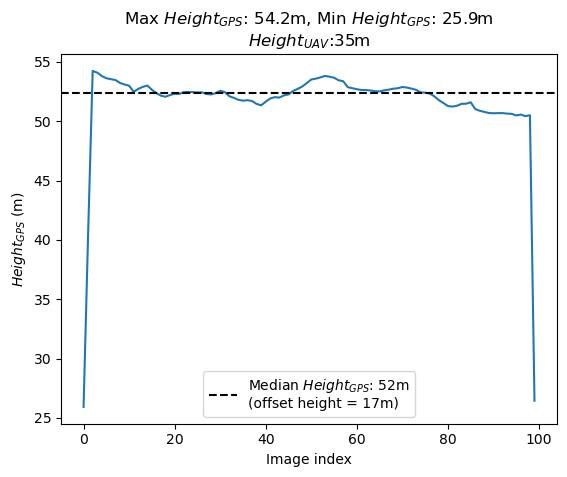

In [ ]:
# get flight info
height_dict = FlightAttributes.get_heights(imagePath, flight_attributes_df)
print(height_dict)
FlightAttributes.plot_height(imagePath, flight_attributes_df,height_dict)

# Import GPS points
- Get GPS points from `select_GPS.py`

[10, 12, 14, 18, 21, 28, 31, 39, 42, 53, 56, 64, 68, 74, 77, 80, 84, 85]


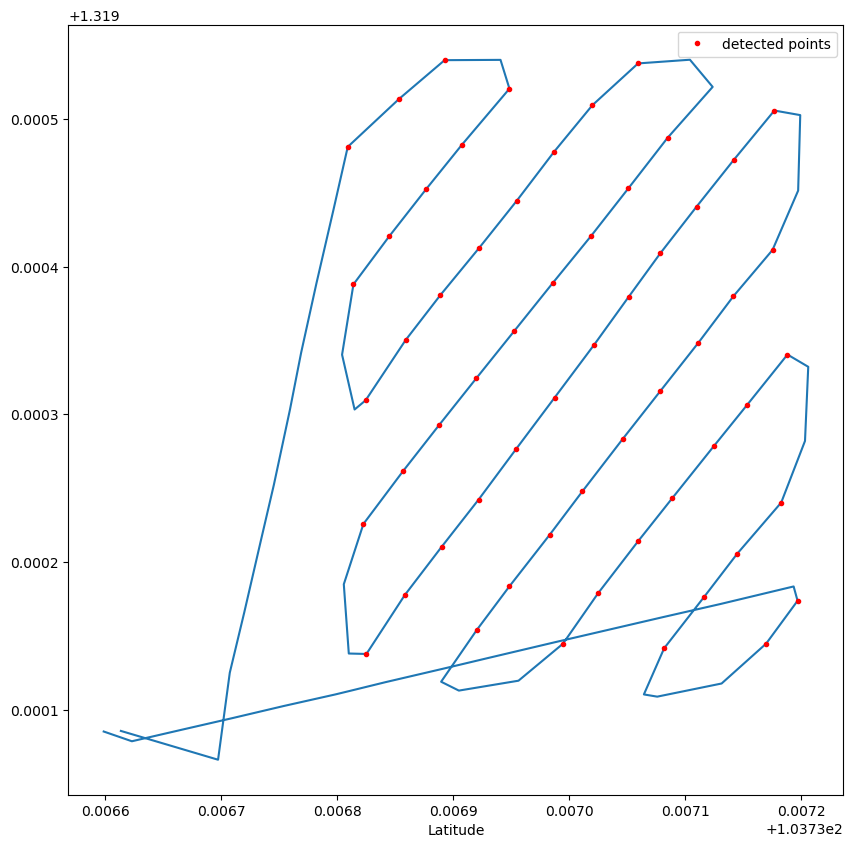

[10, 11, 12, 14, 15, 16, 17, 18, 21, 22, 23, 24, 25, 26, 27, 28, 31, 32, 33, 34, 35, 36, 37, 38, 39, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 56, 57, 58, 59, 60, 61, 62, 63, 64, 68, 69, 70, 71, 72, 73, 74, 77, 78, 79, 80, 84, 85]


In [ ]:
# import GPS points
ls_idx = FlightAttributes.readSelectedGPS(imagePath)
# plot selected GPS points
DL = FlightAttributes.DetectLines(flight_attributes_df, n = 3, thresh=0.99, plot=True)
flight_points = DL.get_points(flight_points = ls_idx)
print(flight_points)

shape of canvas(3523, 3562, 3)


c:\Users\PAKHUIYING\anaconda3\envs\micasense_clone\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


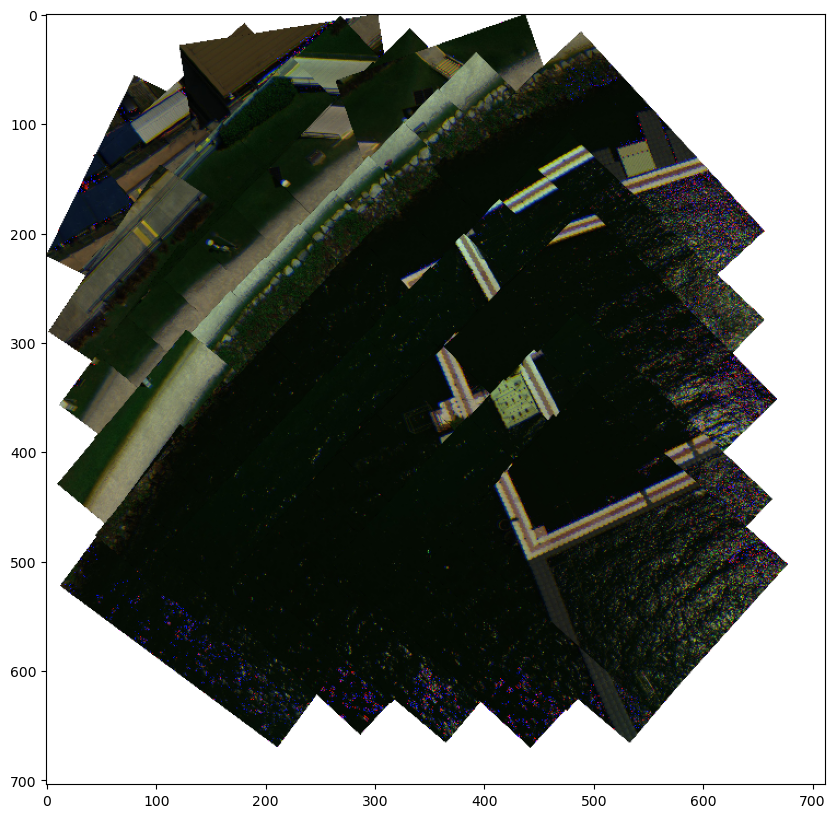

In [ ]:
DEM_offset_height = height_dict['DEM_offset_height']
df_cropped = flight_attributes_df.iloc[flight_points,:]
df_cropped['flight_angle'] = -df_cropped.loc[:,'dls-yaw']/np.pi*180
PG = FlightAttributes.PlotGeoreference(df_cropped,fp_list,DEM_offset_height = DEM_offset_height)
_ = PG.plot_georeference(reduction_factor=5,plot=True)

# Make GIF

In [ ]:
def makeGif(gifParentDir,fileName):
    # gifParentDir = os.path.join(os.path.dirname(imagePath),"images")
    # filepaths
    fp_in = os.path.join(gifParentDir,f'*.png') #"/path/to/image_*.png"
    imgDir = os.path.dirname(gifParentDir)
    gifDir = os.path.join(imgDir,"gif")
    os.mkdir(gifDir) if not os.path.exists(gifDir) else None
    fp_out = os.path.join(gifDir,f'{fileName}.gif')#"/path/to/image.gif"

    # use exit stack to automatically close opened images
    with contextlib.ExitStack() as stack:

            # lazily load images
            imgs = (stack.enter_context(Image.open(f))
                    for f in sorted(glob.glob(fp_in)))

            # extract  first image from iterator
            img = next(imgs)

            # https://pillow.readthedocs.io/en/stable/handbook/image-file-formats.html#gif
            img.save(fp=fp_out, format='GIF', append_images=imgs,
                    save_all=True, duration=200, loop=0)

# Interpolate flight
- interpolate coordinates

In [ ]:
def batchShiftCoord(flight_attributes_df,
                    fp_list,
                    flight_points,
                    dirName = "shiftCoord",
                    interpolate_distance = 0.01,
                    pad_distance = 1.5,
                    estimate_angle="yaw",
                    dist1 = 0,
                    dist2 = 70,
                    height_steps = 6,
                    # graphing params
                    n_fig = 8,
                    scale_factor = 1.05):
    IC = FlightAttributes.InterpolateCoordinates(flight_attributes_df, 
                                interpolate_distance=interpolate_distance, 
                                pad_distance=pad_distance,
                                estimate_angle=estimate_angle)
    interp_dist_dict = IC.get_interpolated_dict()

    for height in range(height_steps): # try offsets in height of up to 5m by 1meters
        DEM_offset_height = height_dict['DEM_offset_height'] - height

        fig, axes = plt.subplots(2,ceil(n_fig/2), figsize=(15,7))

        # dist_shift = int(pad_distance/interpolate_distance) - 1 # minus one so that we dont get indexing error

        # for i, (shift_n,ax) in enumerate(zip(np.linspace(-dist_shift,dist_shift,n_fig,dtype=int),axes.flatten())):
        for i, (shift_n,ax) in enumerate(zip(np.linspace(dist1,dist2,n_fig,dtype=int),axes.flatten())):
            df_interpolated = IC.shift_coord(interp_dist_dict, shift_n=shift_n)
            df_cropped = df_interpolated.iloc[flight_points,:]
            PG = FlightAttributes.PlotGeoreference(df_cropped,fp_list,DEM_offset_height = DEM_offset_height)
            try:
                im_display = PG.plot_georeference(reduction_factor=5,plot=False, scale_factor=scale_factor)
            except:
                scale_factor *= 1.05
                im_display = PG.plot_georeference(reduction_factor=5,plot=False, scale_factor=scale_factor)
            ax.imshow(im_display)
            ax.axis('off')
            ax.set_title(f'Coord shift: {shift_n}')
            
        correctedHeight = int(height_dict['measuredHeight'] - DEM_offset_height)
        fig.suptitle(f"Height: {height_dict['actualHeight']}m, Corrected height: {correctedHeight}m")
        plt.show()
        # save fig
        parentDir = os.path.join(os.path.dirname(imagePath),"images",dirName)
        os.mkdir(parentDir) if not os.path.exists(parentDir) else None
        fname = os.path.join(parentDir,f'offsetHeight{int(DEM_offset_height)}.png')
        fig.savefig(fname)
    
    # create gifs
    makeGif(parentDir,dirName)
    return

# Interpolate flight
- time delay

In [ ]:
def batchTimeDelay(flight_attributes_df,
                    fp_list,
                    flight_points,
                    dirName = "timeDelay",
                    est_time_delay1 = 0,
                    est_time_delay2 = -2,
                    estimate_angle="yaw",
                    height_steps = 6,
                    # graphing params
                    n_fig = 8,
                    scale_factor = 1.05):
    IF = FlightAttributes.InterpolateFlight(flight_attributes_df, 
                                                interpolate_milliseconds=100, 
                                                estimate_angle = estimate_angle)
    df_interpolated = IF.interpolate_flight(plot=False)

    for height in range(height_steps): # try offsets in height of up to 5m by 1meters
        DEM_offset_height = height_dict['DEM_offset_height'] - height

        fig, axes = plt.subplots(2,ceil(n_fig/2), figsize=(15,7))

        # dist_shift = int(pad_distance/interpolate_distance) - 1 # minus one so that we dont get indexing error

        # for i, (shift_n,ax) in enumerate(zip(np.linspace(-dist_shift,dist_shift,n_fig,dtype=int),axes.flatten())):
        for i, (td,ax) in enumerate(zip(np.linspace(est_time_delay2,est_time_delay1, n_fig),axes.flatten())):
            df1 = FlightAttributes.time_delta_correction(df_interpolated, timedelta=td, 
                                                 columns_to_shift = ['timestamp', 'timedelta', 'latitude', 'longitude'])
            df_cropped = df1.iloc[flight_points,:]
            PG = FlightAttributes.PlotGeoreference(df_cropped,fp_list,DEM_offset_height = DEM_offset_height)
            try:
                im_display = PG.plot_georeference(reduction_factor=5,plot=False, scale_factor=scale_factor)
            except:
                scale_factor *= 1.05
                im_display = PG.plot_georeference(reduction_factor=5,plot=False, scale_factor=scale_factor)
            ax.imshow(im_display)
            ax.axis('off')
            ax.set_title(f'Time delay: {td:.2f} s')
            
        correctedHeight = int(height_dict['measuredHeight'] - DEM_offset_height)
        fig.suptitle(f"Height: {height_dict['actualHeight']}m, Corrected height: {correctedHeight}m")
        plt.show()
        # save fig
        parentDir = os.path.join(os.path.dirname(imagePath),"images",dirName)
        os.mkdir(parentDir) if not os.path.exists(parentDir) else None
        fname = os.path.join(parentDir,f'offsetHeight{int(DEM_offset_height)}.png')
        fig.savefig(fname)
    
    # create gifs
    makeGif(parentDir,dirName)
    return

shape of canvas(3523, 3562, 3)
shape of canvas(3545, 3535, 3)
shape of canvas(3565, 3550, 3)
shape of canvas(3585, 3576, 3)
shape of canvas(3605, 3602, 3)
shape of canvas(3626, 3612, 3)
shape of canvas(3646, 3615, 3)
shape of canvas(3666, 3619, 3)


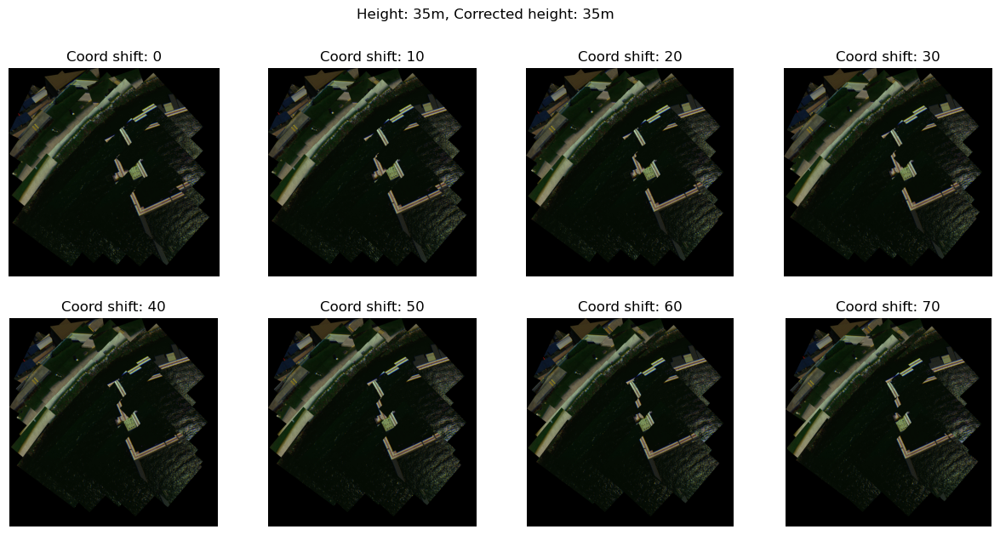

shape of canvas(3466, 3506, 3)
shape of canvas(3487, 3481, 3)
shape of canvas(3507, 3495, 3)
shape of canvas(3526, 3520, 3)
shape of canvas(3546, 3545, 3)
shape of canvas(3566, 3555, 3)
shape of canvas(3586, 3559, 3)
shape of canvas(3605, 3562, 3)


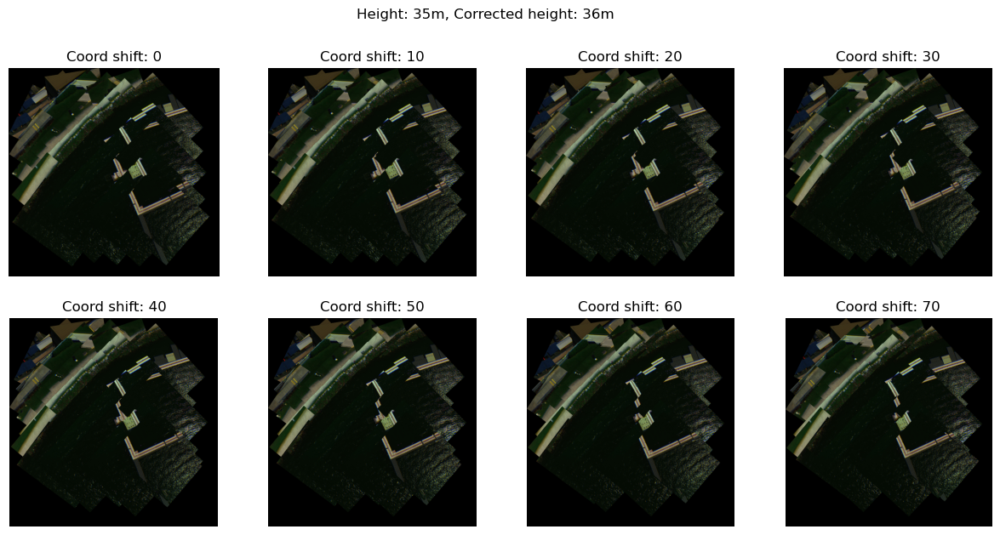

shape of canvas(3411, 3454, 3)
shape of canvas(3433, 3429, 3)
shape of canvas(3452, 3443, 3)
shape of canvas(3471, 3468, 3)
shape of canvas(3490, 3492, 3)
shape of canvas(3509, 3502, 3)
shape of canvas(3528, 3505, 3)
shape of canvas(3548, 3508, 3)


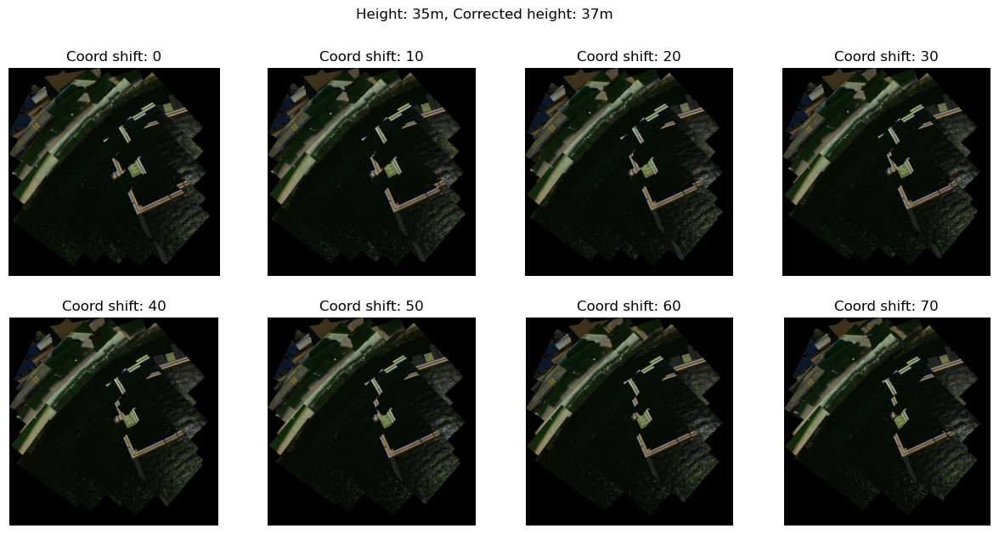

shape of canvas(3360, 3404, 3)
shape of canvas(3381, 3380, 3)
shape of canvas(3400, 3394, 3)
shape of canvas(3419, 3418, 3)
shape of canvas(3437, 3441, 3)
shape of canvas(3456, 3451, 3)
shape of canvas(3474, 3454, 3)
shape of canvas(3493, 3457, 3)


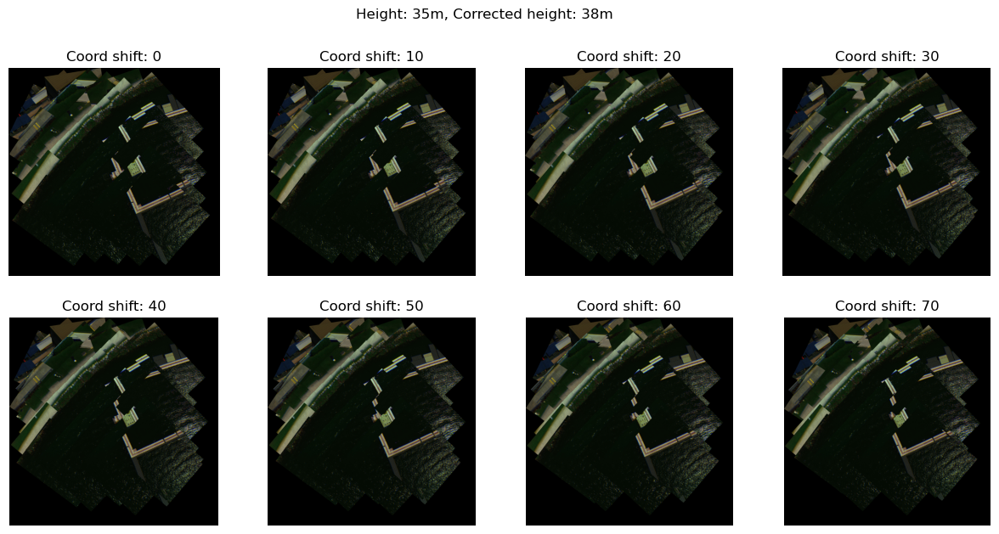

shape of canvas(3311, 3357, 3)
shape of canvas(3332, 3333, 3)
shape of canvas(3351, 3348, 3)
shape of canvas(3369, 3371, 3)
shape of canvas(3387, 3394, 3)
shape of canvas(3405, 3403, 3)
shape of canvas(3423, 3406, 3)
shape of canvas(3441, 3409, 3)


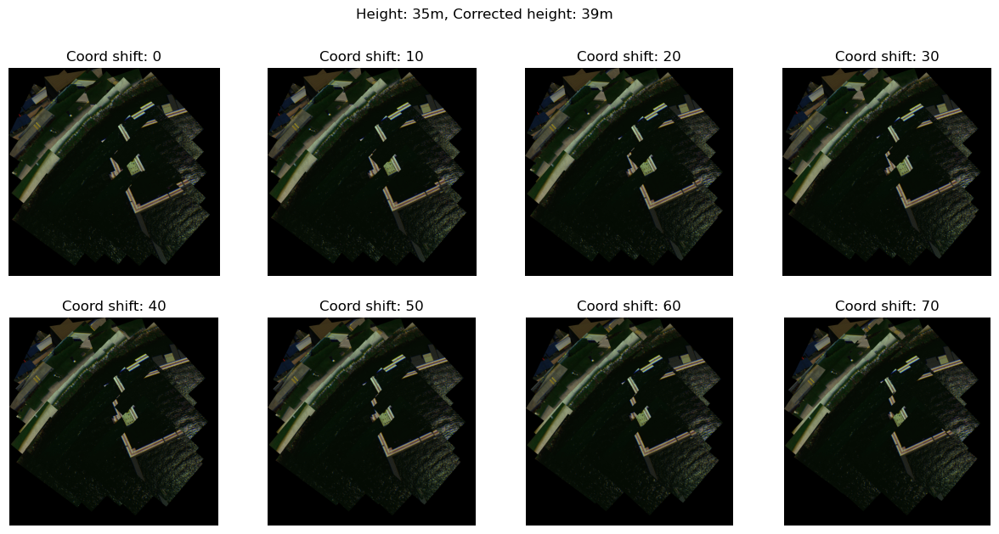

shape of canvas(3265, 3312, 3)
shape of canvas(3286, 3289, 3)
shape of canvas(3304, 3303, 3)
shape of canvas(3322, 3326, 3)
shape of canvas(3339, 3348, 3)
shape of canvas(3357, 3357, 3)
shape of canvas(3375, 3360, 3)
shape of canvas(3392, 3363, 3)


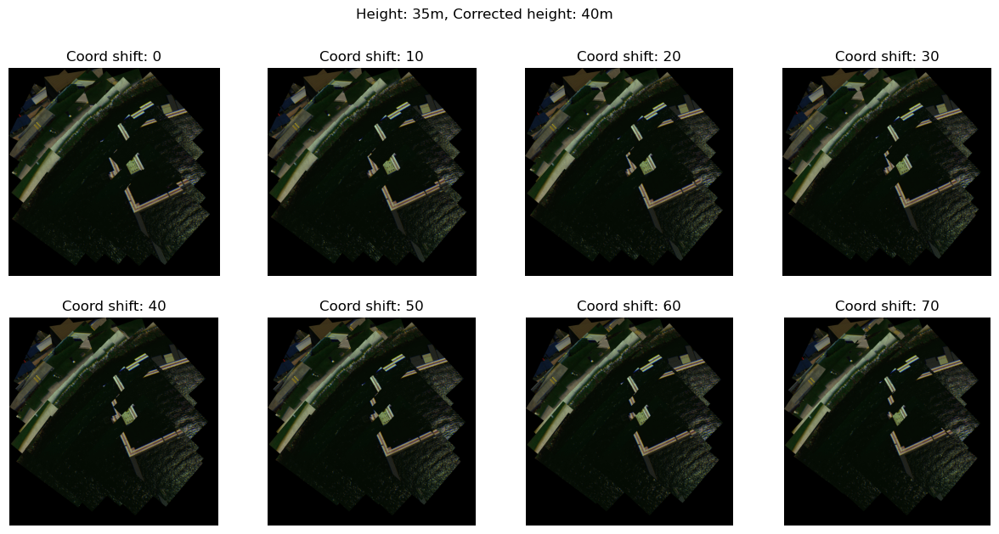

In [ ]:
batchShiftCoord(flight_attributes_df,fp_list,flight_points)

100it [00:00, 1686.65it/s]

rows shifted: -20
shape of canvas(3729, 3621, 3)
rows shifted: -17
shape of canvas(3649, 3602, 3)
rows shifted: -14
shape of canvas(3627, 3584, 3)
rows shifted: -11
shape of canvas(3605, 3566, 3)
rows shifted: -8
shape of canvas(3583, 3566, 3)
rows shifted: -5
shape of canvas(3561, 3551, 3)
rows shifted: -2
shape of canvas(3539, 3557, 3)
rows shifted: 0
shape of canvas(3523, 3562, 3)


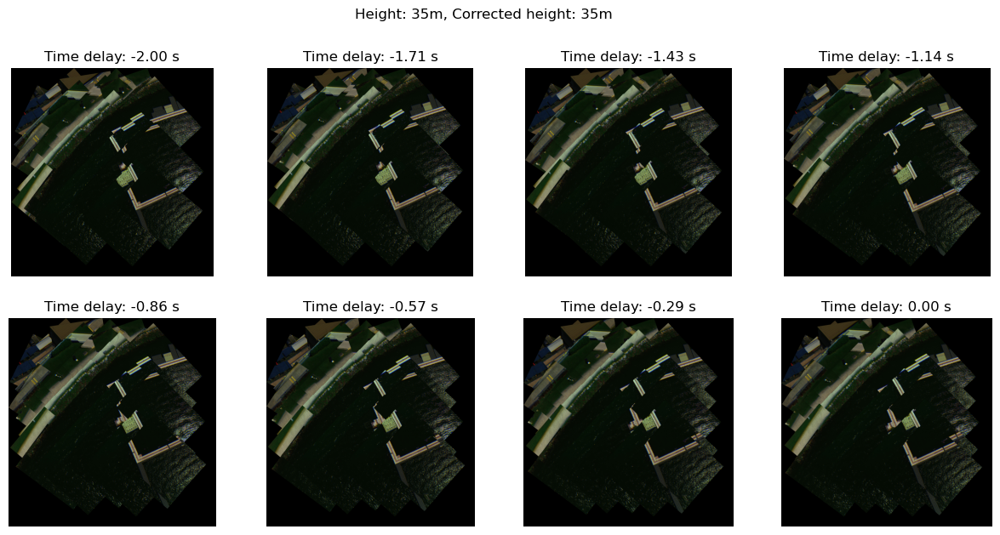

rows shifted: -20
shape of canvas(3668, 3564, 3)
rows shifted: -17
shape of canvas(3589, 3546, 3)
rows shifted: -14
shape of canvas(3567, 3528, 3)
rows shifted: -11
shape of canvas(3546, 3511, 3)
rows shifted: -8
shape of canvas(3525, 3511, 3)
rows shifted: -5
shape of canvas(3503, 3496, 3)
rows shifted: -2
shape of canvas(3482, 3502, 3)
rows shifted: 0
shape of canvas(3466, 3506, 3)


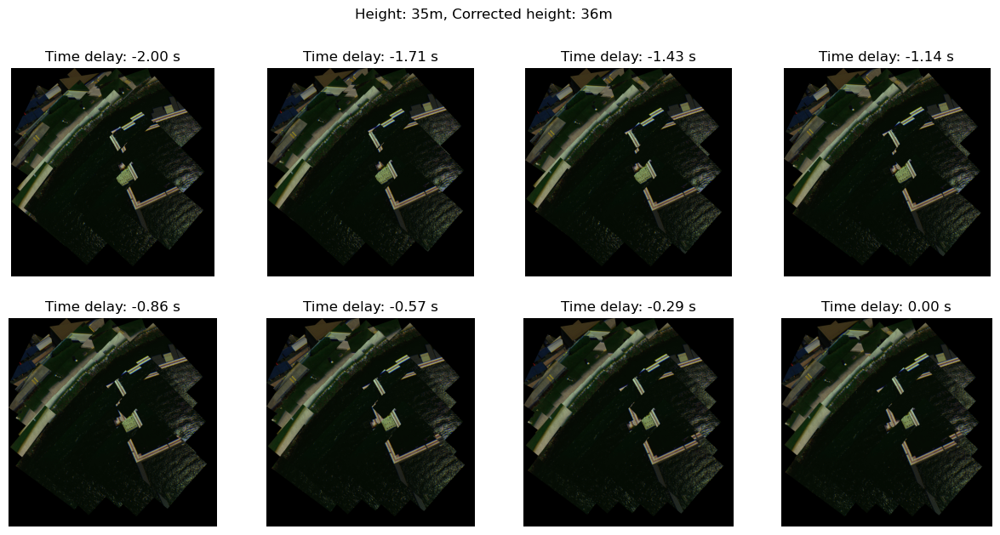

rows shifted: -20
shape of canvas(3610, 3510, 3)
rows shifted: -17
shape of canvas(3532, 3493, 3)
rows shifted: -14
shape of canvas(3511, 3475, 3)
rows shifted: -11
shape of canvas(3490, 3458, 3)
rows shifted: -8
shape of canvas(3469, 3458, 3)
rows shifted: -5
shape of canvas(3448, 3444, 3)
rows shifted: -2
shape of canvas(3427, 3450, 3)
rows shifted: 0
shape of canvas(3411, 3454, 3)


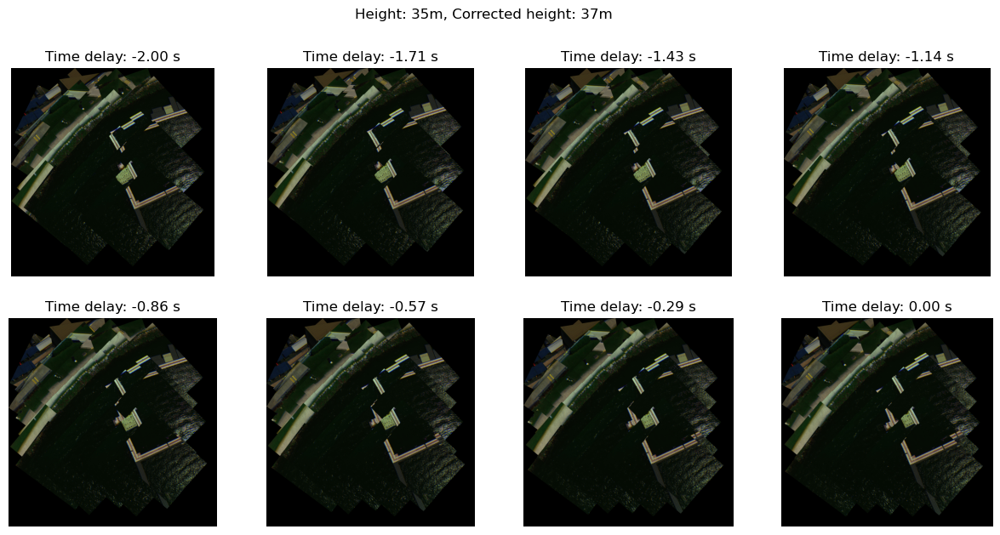

rows shifted: -20
shape of canvas(3555, 3459, 3)
rows shifted: -17
shape of canvas(3478, 3442, 3)
rows shifted: -14
shape of canvas(3457, 3425, 3)
rows shifted: -11
shape of canvas(3437, 3409, 3)
rows shifted: -8
shape of canvas(3417, 3409, 3)
rows shifted: -5
shape of canvas(3396, 3394, 3)
rows shifted: -2
shape of canvas(3376, 3400, 3)
rows shifted: 0
shape of canvas(3360, 3404, 3)


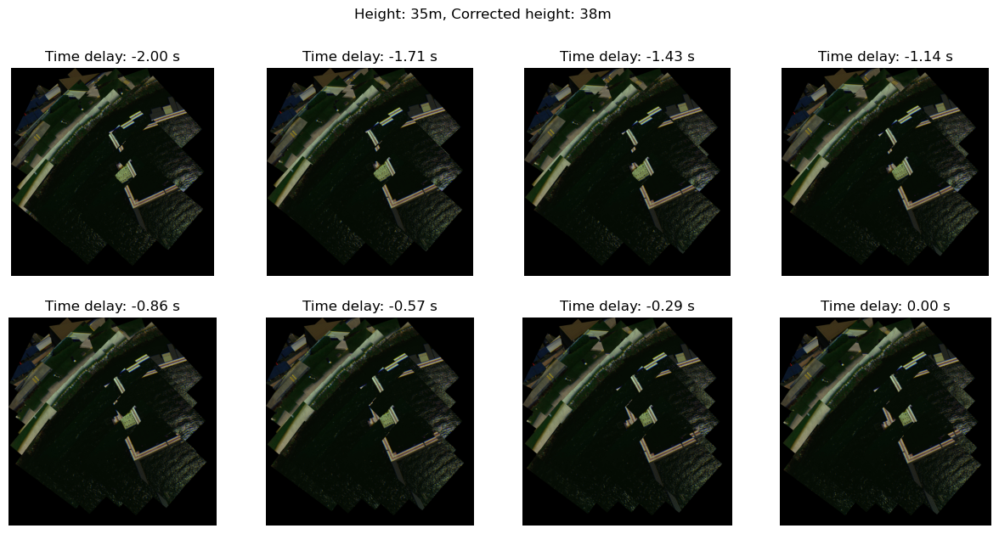

rows shifted: -20
shape of canvas(3503, 3411, 3)
rows shifted: -17
shape of canvas(3426, 3394, 3)
rows shifted: -14
shape of canvas(3406, 3378, 3)
rows shifted: -11
shape of canvas(3387, 3362, 3)
rows shifted: -8
shape of canvas(3367, 3362, 3)
rows shifted: -5
shape of canvas(3347, 3347, 3)
rows shifted: -2
shape of canvas(3327, 3353, 3)
rows shifted: 0
shape of canvas(3311, 3357, 3)


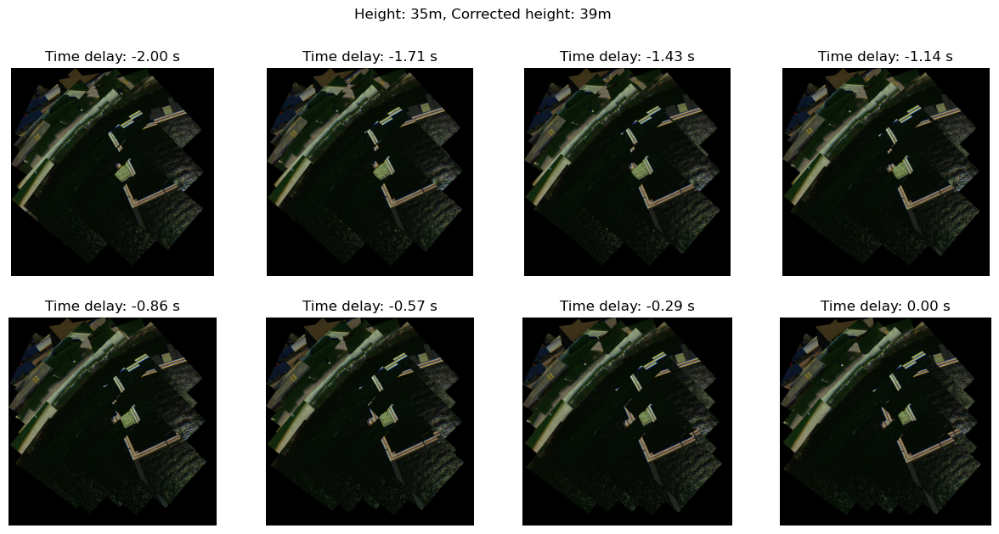

rows shifted: -20
shape of canvas(3454, 3365, 3)
rows shifted: -17
shape of canvas(3378, 3349, 3)
rows shifted: -14
shape of canvas(3358, 3333, 3)
rows shifted: -11
shape of canvas(3339, 3317, 3)
rows shifted: -8
shape of canvas(3320, 3318, 3)
rows shifted: -5
shape of canvas(3301, 3303, 3)
rows shifted: -2
shape of canvas(3281, 3309, 3)
rows shifted: 0
shape of canvas(3265, 3312, 3)


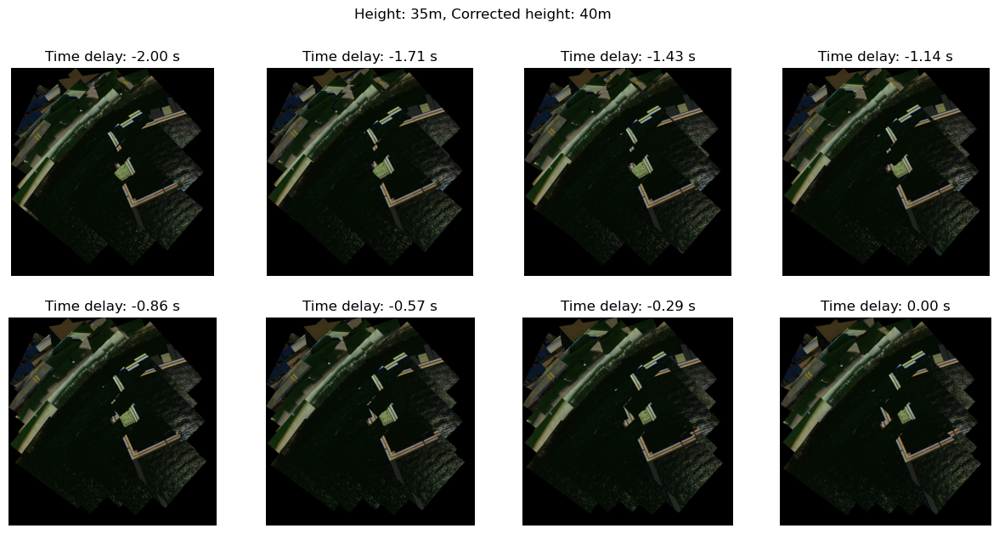

In [ ]:
batchTimeDelay(flight_attributes_df,fp_list,flight_points)